In [1]:
import io
import os
import sys
import time
import glob
import pickle

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import sklearn.metrics as metrics
from PIL import Image

In [2]:
sys.path.append('/home/y/yuanbo/fyp/estimate_jpeg')
sys.path.append('/home/y/yuanbo/fyp/estimate_jpeg/utils')

from utils import *

## Files to analyze

**1. `res_random_qf`**

Results from q-table estimation algorithm on doubly compressed images taken from the RAISE_1k dataset. They are compressed with the standard JPEG q-table, with randomly chosen quality factors from the set $\{50,55,60,65,70,75,80,85,90,95,100\}$ for both compressions. There are a total of 2000 images in this dataset.

**2. `casia_jpeg_results.pkl` and `casia_jpeg_results_fp.pkl`**

Results of forgery detection algorithm on JPEG subset of CASIA2.0 dataset. False positive samples are generated by taking random crops on non-tampered locations of the image. There are a total of 1023 images in the CASIA dataset, and by adding the false positives samples there are a total of 2046 images.

## How robust is the q-table estimation algorithm? What are the accuracies of each location?

### Simple accuracy measurement

Start with the simplest measurement of accuracy, check if the estimated number is same as ground truth at each location

In [3]:
with open('../experiments/res_random_qf.pkl', 'rb') as handle:
    res_random_qf = pickle.load(handle)
    
res_df = pd.DataFrame(res_random_qf)
res_df.head()

,img,qf_1,qf_2,est_q_table
0,r146771d7t.jpg,60,55,"[[2.0, 2.0, 1.0, 13.0, 20.0, 4.0, 35.0, 9.0], ..."
1,r1e3303ebt.jpg,90,50,"[[16.0, 2.0, 2.0, 15.0, 8.0, 37.0, 38.0, 68.0]..."
2,r1a2095b2t.jpg,50,60,"[[16.0, 11.0, 8.0, 16.0, 24.0, 41.0, 32.0, 73...."
3,r15dfc1b8t.jpg,100,55,"[[2.0, 2.0, 1.0, 13.0, 6.0, 5.0, 4.0, 4.0], [1..."
4,r02897203t.jpg,50,100,"[[16.0, 11.0, 10.0, 16.0, 24.0, 40.0, 51.0, 96..."


Here we split the results into the following scenarios to analyze the algorithm's performance in each scenario:
1. QF1 > QF2
2. QF1 < QF2
3. QF1 = QF2

In [4]:
qf1_greater_qf2 = res_df[res_df['qf_1'] > res_df['qf_2']]
qf1_lesser_qf2 = res_df[res_df['qf_1'] < res_df['qf_2']]
qf1_same_qf2 = res_df[res_df['qf_1'] == res_df['qf_2']]

qf_general_categories = {
    "Q1 > Q2": qf1_greater_qf2,
    "Q1 < Q2": qf1_lesser_qf2,
    "Q1 = Q2": qf1_same_qf2,
    "Combined": res_df
}

for k, v in qf_general_categories.items():
    print(f"{k}: {len(v)}")

Q1 > Q2: 905
Q1 < Q2: 916
Q1 = Q2: 178
Combined: 1999


We can further split the quality factors into the following buckets:
 - Low: 50,  55,  60
 - Med: 65, 70,  75,  80
 - High: 85, 90,  95

Then, we end up with the following 9 more specific scenarios where a doubly compressed image can fall under.

In [5]:
# Low-High
lh = res_df[(res_df["qf_1"] <= 65) & (res_df["qf_2"] >= 90)]

# High-Low
hl = res_df[(res_df["qf_1"] >= 90) & (res_df["qf_2"] <= 65)]

# Low-Med
lm = res_df[(res_df["qf_1"] <= 65) & ((res_df["qf_2"] > 65) & (res_df["qf_2"] < 90))]

# Med-Low
ml = res_df[((res_df["qf_1"] > 65) & (res_df["qf_1"] < 90)) & (res_df["qf_2"] <= 65)]

# Med-High
mh = res_df[((res_df["qf_1"] > 65) & (res_df["qf_1"] < 90)) & (res_df["qf_2"] >= 90)]

# High-Med
hm = res_df[(res_df["qf_1"] >= 90) & ((res_df["qf_2"] > 65) & (res_df["qf_2"] < 90))]

# Low-Low
ll = res_df[(res_df["qf_1"] <= 65) & (res_df["qf_2"] <= 65)]

# Med-Med
mm = res_df[((res_df["qf_1"] > 65) & (res_df["qf_1"] < 90)) & ((res_df["qf_2"] > 65) & (res_df["qf_2"] < 90))]

# High-High
hh = res_df[(res_df["qf_1"] >= 90) & (res_df["qf_2"] >= 90)]

qf_specific_categories = {
    "Low-Low": ll,
    "Low-Med": lm,
    "Low-High": lh,
    "Med-Low": ml,
    "Med-Med": mm,
    "Med-High": mh,
    "High-Low": hl,
    "High-Med": hm,
    "High-High": hh,
}

for k, v in qf_specific_categories.items():
    print(f"{k}: {len(v)}")

Low-Low: 249
Low-Med: 274
Low-High: 220
Med-Low: 266
Med-Med: 261
Med-High: 182
High-Low: 198
High-Med: 212
High-High: 137


In [5]:
# Low-High
lh = res_df[(res_df["qf_1"] <= 60) & (res_df["qf_2"] >= 85)]

# High-Low
hl = res_df[(res_df["qf_1"] >= 85) & (res_df["qf_2"] <= 65)]

# Low-Med
lm = res_df[(res_df["qf_1"] <= 60) & ((res_df["qf_2"] > 60) & (res_df["qf_2"] < 85))]

# Med-Low
ml = res_df[((res_df["qf_1"] > 60) & (res_df["qf_1"] < 85)) & (res_df["qf_2"] <= 60)]

# Med-High
mh = res_df[((res_df["qf_1"] > 60) & (res_df["qf_1"] < 85)) & (res_df["qf_2"] >= 85)]

# High-Med
hm = res_df[(res_df["qf_1"] >= 85) & ((res_df["qf_2"] > 60) & (res_df["qf_2"] < 85))]

# Low-Low
ll = res_df[(res_df["qf_1"] <= 60) & (res_df["qf_2"] <= 60)]

# Med-Med
mm = res_df[((res_df["qf_1"] > 60) & (res_df["qf_1"] < 85)) & ((res_df["qf_2"] > 60) & (res_df["qf_2"] < 85))]

# High-High
hh = res_df[(res_df["qf_1"] >= 85) & (res_df["qf_2"] >= 85)]

qf_specific_categories = {
    "Low-Low": ll,
    "Low-Med": lm,
    "Low-High": lh,
    "Med-Low": ml,
    "Med-Med": mm,
    "Med-High": mh,
    "High-Low": hl,
    "High-Med": hm,
    "High-High": hh,
}

for k, v in qf_specific_categories.items():
    print(f"{k}: {len(v)}")

Low-Low: 143
Low-Med: 208
Low-High: 214
Med-Low: 199
Med-Med: 266
Med-High: 247
High-Low: 256
High-Med: 260
High-High: 259


Convert to zigzag indices form and plot error on graph

In [6]:
def compute_diff(qf, est_q_table):
    gt_q_table = scale_q_table(STANDARD_LUMI_QT, qf)
    return est_q_table - gt_q_table

def compute_estimation_acc(res_df):
    diff = np.stack(res_df.apply(lambda x: compute_diff(x["qf_1"], x["est_q_table"]), axis=1).to_numpy(), axis=0)
    acc = (np.count_nonzero(diff==0, axis=0) / diff.shape[0] * 100).round(2)
    return acc[ZIGZAG_ROW_IDX, ZIGZAG_COL_IDX]

def plot_estimation_acc(acc_dict):
    x = np.arange(64)
    for k, v in acc_dict.items():
        plt.plot(x, v, label=k)
    plt.xlabel("Location of quantization factor in zig-zag order")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

In [9]:
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams["figure.figsize"] = [8, 6]

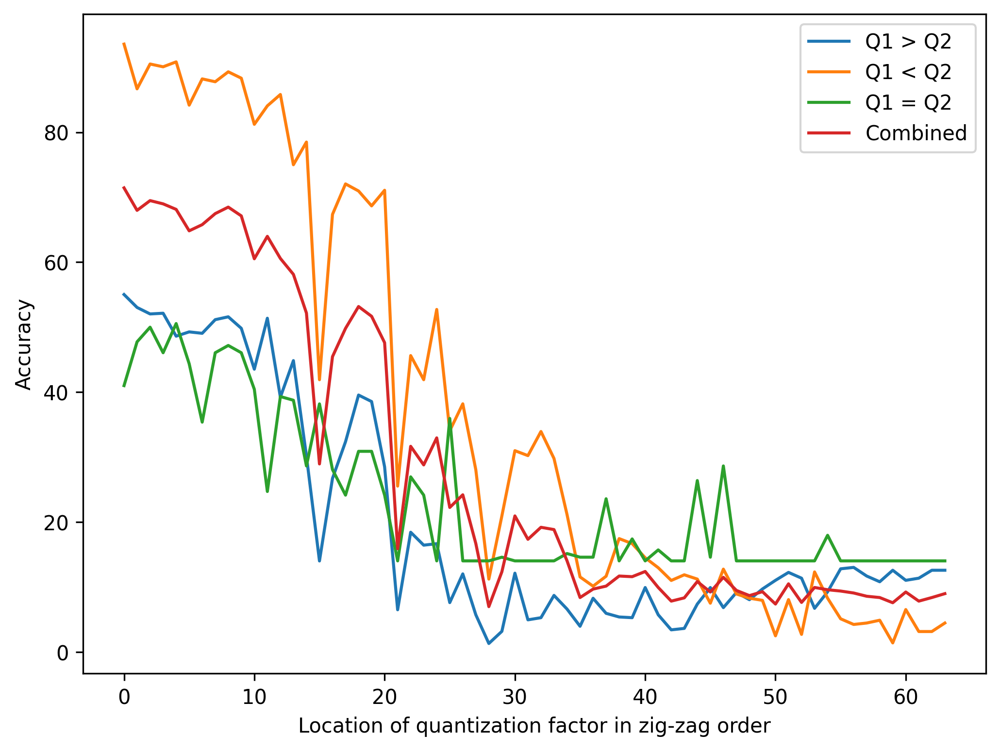

In [10]:
acc_qf_general = {}
for k, v in qf_general_categories.items():
    acc_qf_general[k] = compute_estimation_acc(v)

plot_estimation_acc(acc_qf_general)

When the QF1 < QF2 (orange), the algorithm's performance is much better than in other scenarios. This corresponds with the author's reported performance. Also, the estimation accuracy drops sharply when we reach around location 25 in the quantization table.

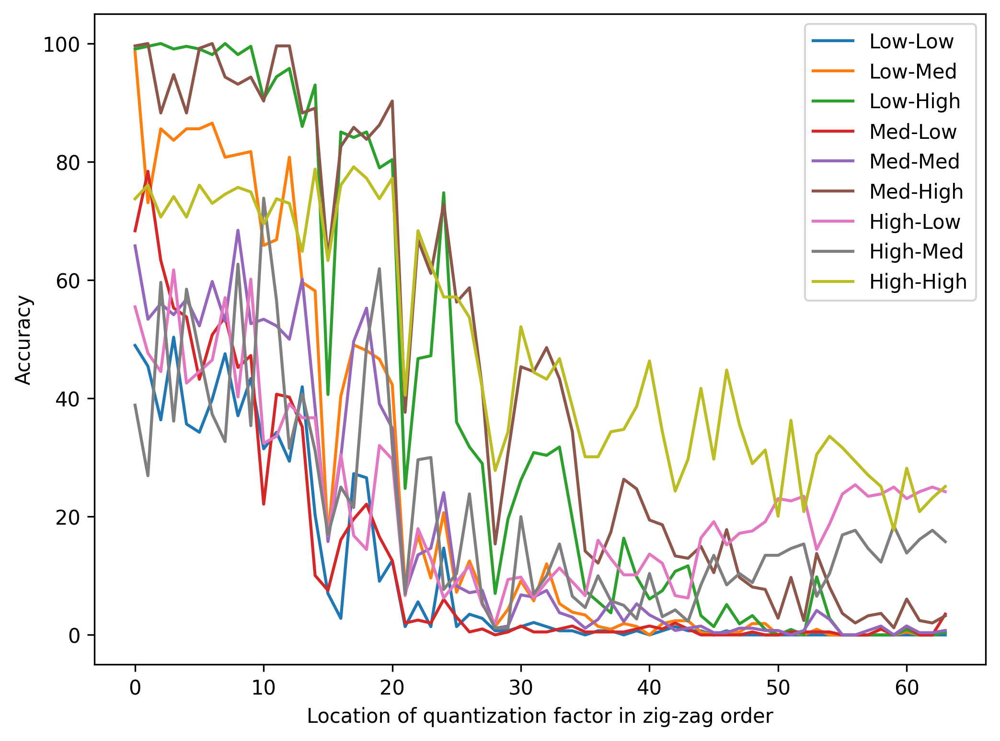

In [11]:
acc_qf_specific = {}
for k, v in qf_specific_categories.items():
    acc_qf_specific[k] = compute_estimation_acc(v)

plot_estimation_acc(acc_qf_specific)

Looking at this graph, more specifically at the top left portion, there is subsection of categories that perform better than the rest, and that is:
- Low-High (forest green)
- Med-High (brown)
- Low-Med (orange)
- High-High (lime green)

These four categories perform markedly better than the rest. For `Low-High`, `Med-High` and `Low-Med`, this is expected since they fall under the scenario where QF1 < QF2, which from the previous graph we know has the best performance.

### Mean Absolute Error (if the predicted q-number is wrong, how wrong is it?)

In [12]:
def compute_mae(res_df):
    diff = np.stack(res_df.apply(lambda x: compute_diff(x["qf_1"], x["est_q_table"]), axis=1).to_numpy(), axis=0)
    mae = np.abs(diff).mean(axis=0)
    return mae[ZIGZAG_ROW_IDX, ZIGZAG_COL_IDX]

def plot_mae(mae_dict):
    x = np.arange(64)
    for k, v in mae_dict.items():
        plt.plot(x, v, label=k)
    plt.xlabel("Location of quantization factor in zigzag order")
    plt.ylabel("Mean Absolute Error")
    plt.legend()
    plt.show()

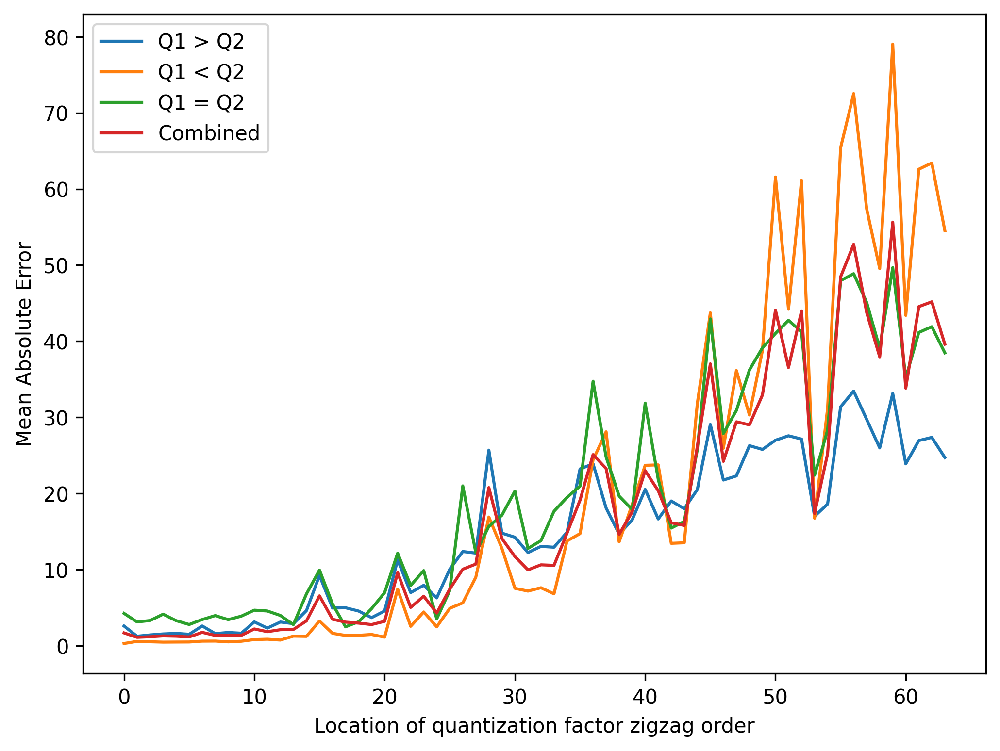

In [13]:
mae_qf_general = {}
for k, v in qf_general_categories.items():
    mae_qf_general[k] = compute_mae(v)

plot_mae(mae_qf_general)

Even though in the previous section the estimation accuracy is not good when QF1 > QF2, over here as seen in the blue curve, the MAE is still relatively low, which means that the predicted number is not very far off from the ground truth value.

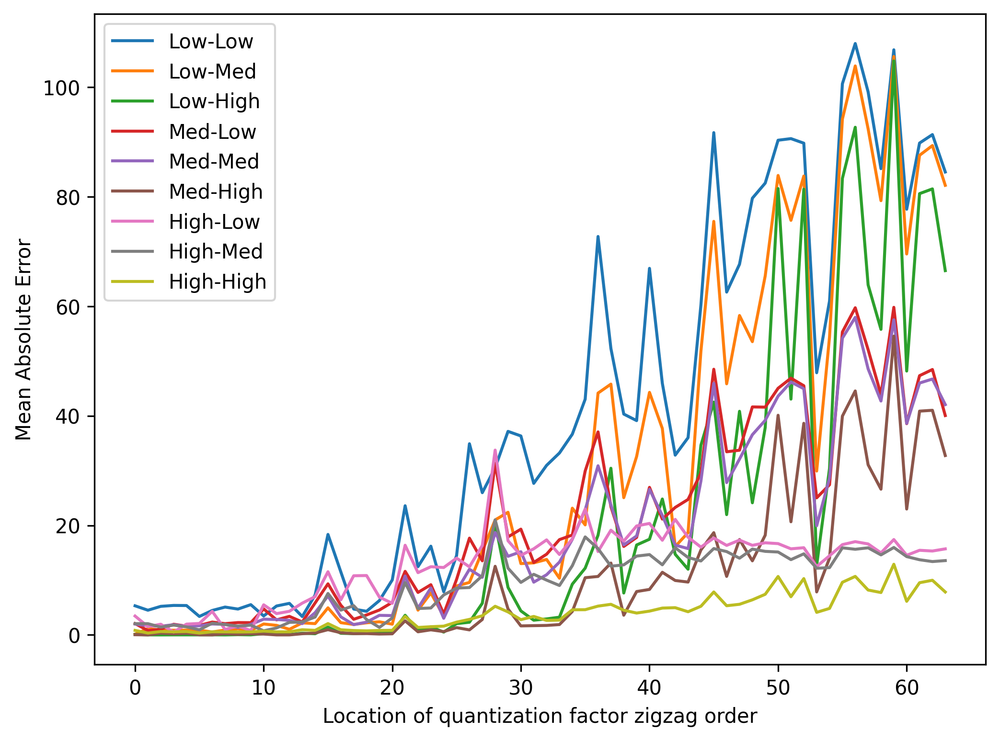

In [34]:
mae_qf_specific = {}
for k, v in qf_specific_categories.items():
    mae_qf_specific[k] = compute_mae(v)

plot_mae(mae_qf_specific)

As with the previous section, the best performing scenarios are the following:
- Low-High (forest green)
- Med-High (brown)
- Low-Med (orange)
- High-High (lime green)

We can also observe that there are some locations in the higher numbers that still have a relatively low MAE with respect to other locations. This motivates us to select positions with low MAE and use these positions as predictors to determine if an image is tampered or not in the subsequent section.

## How is the current model performing?

Look at `casia_jpeg_results.pkl` and `casia_jpeg_results_fp.pkl`. They have the following relevant keys:
- `est_clean`: Estimated q-table for non-tampered portions of image.
- `est_tampered`: Estimated q-table for tampered portions of image.
- `tampered_path`: Path to tampered image.
- `gt_path`: Path to ground truth mask.
- `block_numbers`: Dictionary with the following keys: 'tampered_dct_blocks', 'clean_dct_blocks', 'cropped_tampered_dct_blocks', 'cropped_clean_dct_blocks'.

`casia_jpeg_results_fp.pkl` has a few more important keys:
- `fp_mask`: False positive mask that is randomly generated.
- `fp_gt_union`: Union of the false positive mask and ground truth mask.

In [15]:
with open('casia1.0_results.pkl', 'rb') as handle:
    casia_jpeg_results = pickle.load(handle)

with open('casia1.0_results_fp.pkl', 'rb') as handle:
    casia_jpeg_results_fp = pickle.load(handle)

### Use simple difference in each q-number location as binary classifier

First, consider only the first 15 q-number locations. Each location can be seen as a binary classifier, with the classifier function an indicator variable:
$$
\begin{align}
f(y_\text{tampered}, y_\text{clean}) &= \begin{cases}
    1, & \text{if $y_\text{tampered} \neq y_\text{clean}$} \\
    0 & \text{otherwise}
\end{cases} \\
&= \mathbb{1}_{[y_\text{tampered} \neq y_\text{clean}]}
\end{align}
$$
Then, we can treat the 15 locations as an ensemble of 15 binary classifiers. For now we give each binary classifier equal weight:
$$
F_\text{uniform}(\mathbf{y_\text{tampered}, y_\text{clean}}) = \frac{1}{15} \sum^{15}_{i=1} f^{(i)}(y_\text{tampered}^{(i)}, y_\text{clean}^{(i)})
$$

Calculate TPs, FPs, and probability.

In [16]:
def uniform_weight_classifier(tp_results, fp_results, positions):
    tp_diff_zigzag = (np.array(tp_results['est_clean']) - np.array(tp_results['est_tampered']))[:, ZIGZAG_ROW_IDX, ZIGZAG_COL_IDX]
    tp_diff_first_n = tp_diff_zigzag[:,positions]
    tp_prob = np.count_nonzero(tp_diff_first_n, axis=1) / len(positions)

    fp_diff_zigzag = (np.array(fp_results['est_clean']) - np.array(fp_results['est_tampered']))[:, ZIGZAG_ROW_IDX, ZIGZAG_COL_IDX]
    fp_diff_first_n = fp_diff_zigzag[:,positions]
    fp_prob = np.count_nonzero(fp_diff_first_n, axis=1) / len(positions)

    probs = np.concatenate([tp_prob, fp_prob])
    return probs

In [39]:
positions = np.arange(15)
probs = uniform_weight_classifier(casia_jpeg_results, casia_jpeg_results_fp, positions)

In [40]:
tp_len = len(casia_jpeg_results['est_clean'])
fp_len = len(casia_jpeg_results_fp['est_clean'])

labels = np.concatenate([np.ones(tp_len), np.zeros(fp_len)])

In [41]:
def plot_roc_curve(probs_dict, labels):
    for k, p in probs_dict.items():
        fpr, tpr, threshold = metrics.roc_curve(labels, p)
        roc_auc = metrics.auc(fpr, tpr)
        plt.plot(fpr, tpr, label = f'{k} AUC = %0.3f' % roc_auc)
    
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

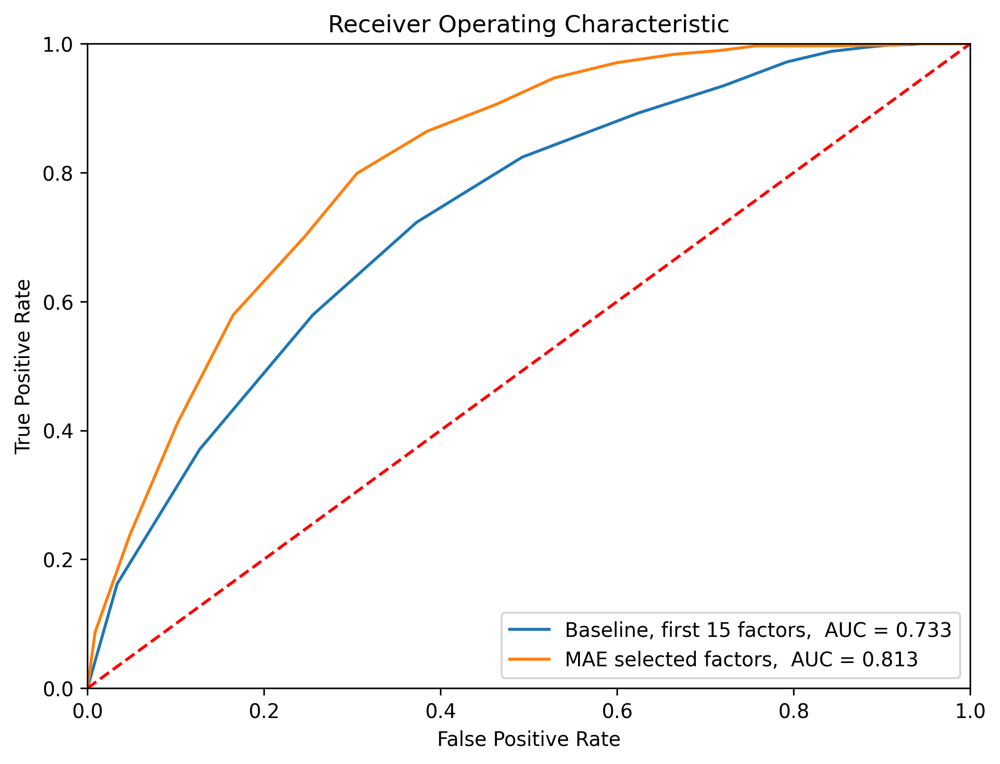

In [44]:
plot_roc_curve({
    "Baseline, first 15 factors, ": probs,
    "MAE selected factors, ": probs_qf_general['Combined']
}, labels)

Baseline method has performance of AUC=0.733

In [21]:
def _plot_roc(probs_dict, labels):
    for k, p in probs_dict.items():
        fpr, tpr, threshold = metrics.roc_curve(labels, p)
        roc_auc = metrics.auc(fpr, tpr)
        plt.plot(fpr, tpr, label = f'{k} AUC = %0.3f' % roc_auc)
    
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')

Now, we utilize the MAE to retrieve locations where MAE < 12. These locations will be used to reliably estimate quantization matrices in images. Since the algorithm's performance varies under different scenarios (e.g. QF1 < QF2 has better performance than QF1 > QF2), the MAE will also be different depending on the scenario. Hence, when we select locations where MAE < 12, different scenarios will yield different locations in the quantization matrix. An example is shown below.

In [22]:
mae_threshold = 12

pos_qf_general = {}
for k, v in mae_qf_general.items():
    pos_qf_general[k] = np.where(v < mae_threshold)[0]

pos_qf_specific = {}
for k, v in mae_qf_specific.items():
    pos_qf_specific[k] = np.where(v < mae_threshold)[0]

In [176]:
print("Locations chosen (QF1 < QF2): ", pos_qf_general["Q1 < Q2"])
print("Locations chosen (QF1 > QF2): ", pos_qf_general["Q1 > Q2"])
print("Locations chosen (QF1 = QF2): ", pos_qf_general["Q1 = Q2"])
print("Locations chosen (Combined) : ", pos_qf_general["Combined"])

Locations chosen (QF1 < QF2):  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 30 31 32 33]
Locations chosen (QF1 > QF2):  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25]
Locations chosen (QF1 = QF2):  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22 23 24
 25]
Locations chosen (Combined) :  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 30 31 32 33]


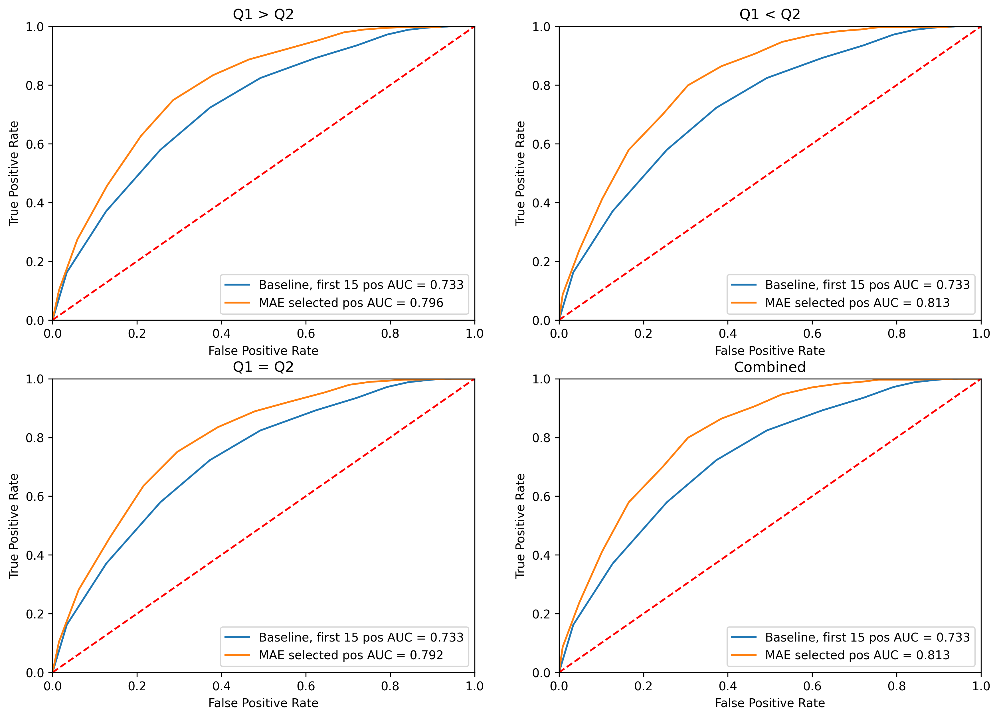

In [24]:
probs_qf_general = {}
for k, pos in pos_qf_general.items():
    probs_qf_general[k] = uniform_weight_classifier(casia_jpeg_results, casia_jpeg_results_fp, pos)

nrow, ncol = 2, 2
plt.figure(figsize=(7*ncol,5*nrow))

for i, (k, v) in enumerate(probs_qf_general.items()):
    plt.subplot(nrow,ncol,i+1)
    plt.title(k)
    _plot_roc({
        "Baseline, first 15 pos": probs,
        "MAE selected pos": probs_qf_general[k],
    }, labels)

Taking the positions where MAE < 12 gives a much stronger performance than only taking the first 15 positions. The method performs the best under the assumption that QF1 < QF2.

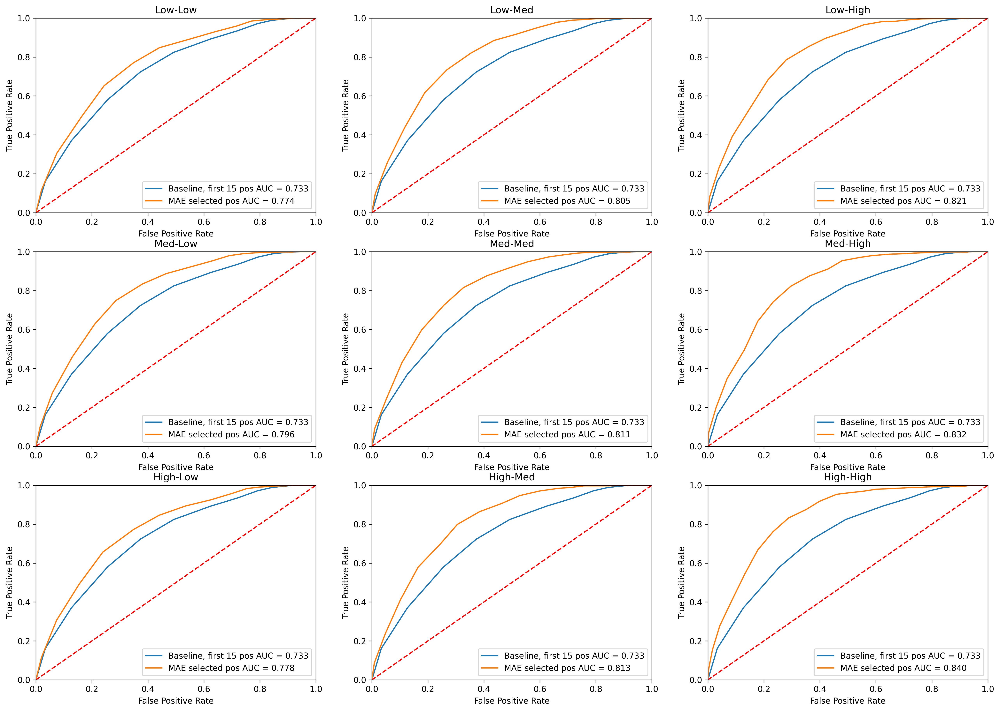

In [25]:
probs_qf_specific = {}
for k, pos in pos_qf_specific.items():
    probs_qf_specific[k] = uniform_weight_classifier(casia_jpeg_results, casia_jpeg_results_fp, pos)

nrow, ncol = 3, 3
plt.figure(figsize=(7*ncol,5*nrow))

for i, (k, v) in enumerate(probs_qf_specific.items()):
    plt.subplot(nrow,ncol,i+1)
    plt.title(k)
    _plot_roc({
        "Baseline, first 15 pos": probs,
        "MAE selected pos": probs_qf_specific[k],
    }, labels)

More specifically, the method performs better when QF2 is high (right column).

### Use accuracy of individual positions to weight each position

The previous method assumes that each position of the 15 numbers hold the same weight in the final decision.

However, as seen in section 2, different positions has different accuracies and so we want to reflect this when making the final decision. We can do so by taking a simple weighted average over the accuracies of each position.

In [26]:
def compute_position_confidence(acc, pos):
    selected_pos = acc[pos]
    total_acc = selected_pos.sum()
    return selected_pos / total_acc

In [27]:
def weighted_classifier(tp_results, fp_results, positions, confidence):
    tp_diff_zigzag = (np.array(tp_results['est_clean']) - np.array(tp_results['est_tampered']))[:, ZIGZAG_ROW_IDX, ZIGZAG_COL_IDX]
    tp_diff = tp_diff_zigzag[:,positions]
    tp_diff[tp_diff != 0] = 1
    tp_prob = (tp_diff * confidence[(None,)]).sum(axis=1)

    fp_diff_zigzag = (np.array(fp_results['est_clean']) - np.array(fp_results['est_tampered']))[:, ZIGZAG_ROW_IDX, ZIGZAG_COL_IDX]
    fp_diff = fp_diff_zigzag[:,positions]
    fp_diff[fp_diff != 0] = 1
    fp_prob = (fp_diff * confidence[(None,)]).sum(axis=1)

    probs = np.concatenate([tp_prob, fp_prob])
    return probs

In [28]:
pos_confidence_qf_general = {}
for k, pos in pos_qf_general.items():
    acc = acc_qf_general[k]
    pos_confidence_qf_general[k] = compute_position_confidence(acc, pos)

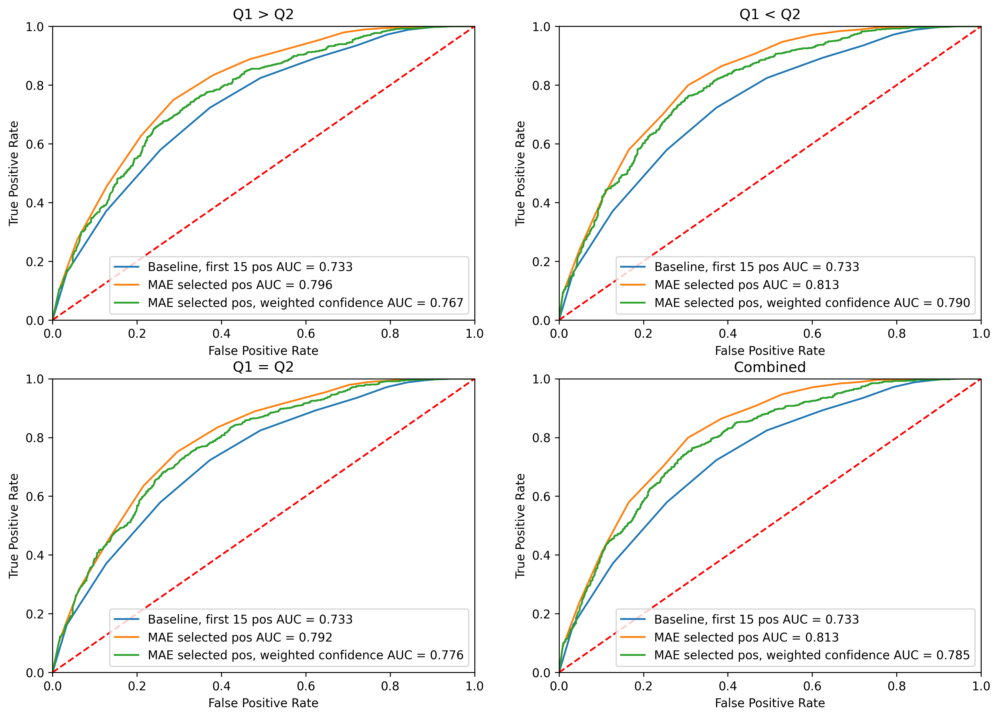

In [29]:
probs_weighted_qf_general = {}
for k, conf in pos_confidence_qf_general.items():
    pos = pos_qf_general[k]
    probs_weighted_qf_general[k] = weighted_classifier(casia_jpeg_results, casia_jpeg_results_fp, pos, conf)

nrow, ncol = 2, 2
plt.figure(figsize=(7*ncol,5*nrow))

for i, (k, v) in enumerate(probs_weighted_qf_general.items()):
    plt.subplot(nrow,ncol,i+1)
    plt.title(k)
    _plot_roc({
        "Baseline, first 15 pos": probs,
        "MAE selected pos": probs_qf_general[k],
        "MAE selected pos, weighted confidence": probs_weighted_qf_general[k],
    }, labels)

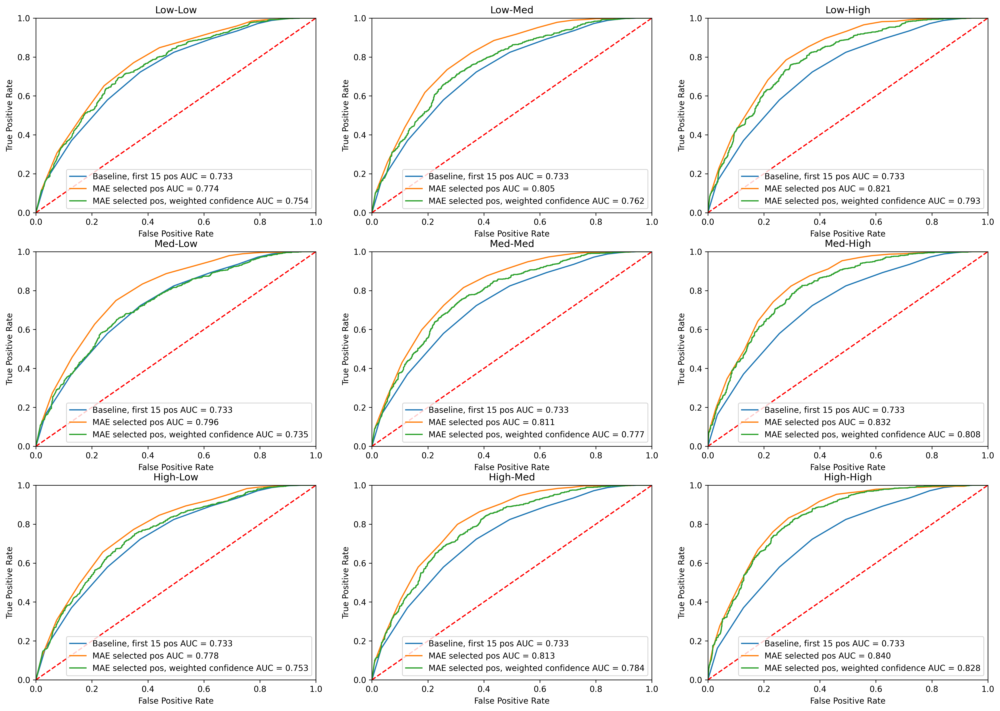

In [30]:
pos_confidence_qf_specific = {}
probs_weighted_qf_specific = {}

for k, pos in pos_qf_specific.items():
    acc = acc_qf_specific[k]
    pos_confidence = compute_position_confidence(acc, pos)
    probs_weighted = weighted_classifier(casia_jpeg_results, casia_jpeg_results_fp, pos, pos_confidence)
    
    pos_confidence_qf_specific[k] = pos_confidence
    probs_weighted_qf_specific[k] = probs_weighted

nrow, ncol = 3, 3
plt.figure(figsize=(7*ncol,5*nrow))

for i, (k, v) in enumerate(probs_weighted_qf_specific.items()):
    plt.subplot(nrow,ncol,i+1)
    plt.title(k)
    _plot_roc({
        "Baseline, first 15 pos": probs,
        "MAE selected pos": probs_qf_specific[k],
        "MAE selected pos, weighted confidence": probs_weighted_qf_specific[k],
    }, labels)

Using accuracy as weights directly here does not help to improve the performance. In all cases the AUC drops when weighting is used.

### Use MAE of each position

Instead of having each binary classifier be an indicator variable, now let it have an acceptable range for predicting a positive label. We will use the MAE for that position to determine the acceptable range.

For example, suppose the MAE of position 3 of the q-table is 1. Then, if the number predicted in both regions at position 3 differs by 1 or less, the binary classifier classifies the image as not tampered. If the number predicted differs by more than 1, then it classfies it as tampered.

In [31]:
def mae_range_classifier(tp_results, fp_results, positions, confidence, mae_range):
    tp_diff_zigzag = (np.array(tp_results['est_clean']) - np.array(tp_results['est_tampered']))[:, ZIGZAG_ROW_IDX, ZIGZAG_COL_IDX]
    tp_diff = tp_diff_zigzag[:,positions]
    
    # if predicted is outside error range, then likely that it is tampered
    tp_diff[np.abs(tp_diff) <= mae_range] = 0
    tp_diff[np.abs(tp_diff) > mae_range] = 1
    tp_prob = (tp_diff * confidence[(None,)]).sum(axis=1)

    fp_diff_zigzag = (np.array(fp_results['est_clean']) - np.array(fp_results['est_tampered']))[:, ZIGZAG_ROW_IDX, ZIGZAG_COL_IDX]
    fp_diff = fp_diff_zigzag[:,positions]
    
    fp_diff[np.abs(fp_diff) <= mae_range] = 0
    fp_diff[np.abs(fp_diff) > mae_range] = 1
    
    fp_prob = (fp_diff * confidence[(None,)]).sum(axis=1)

    probs = np.concatenate([tp_prob, fp_prob])
    return probs

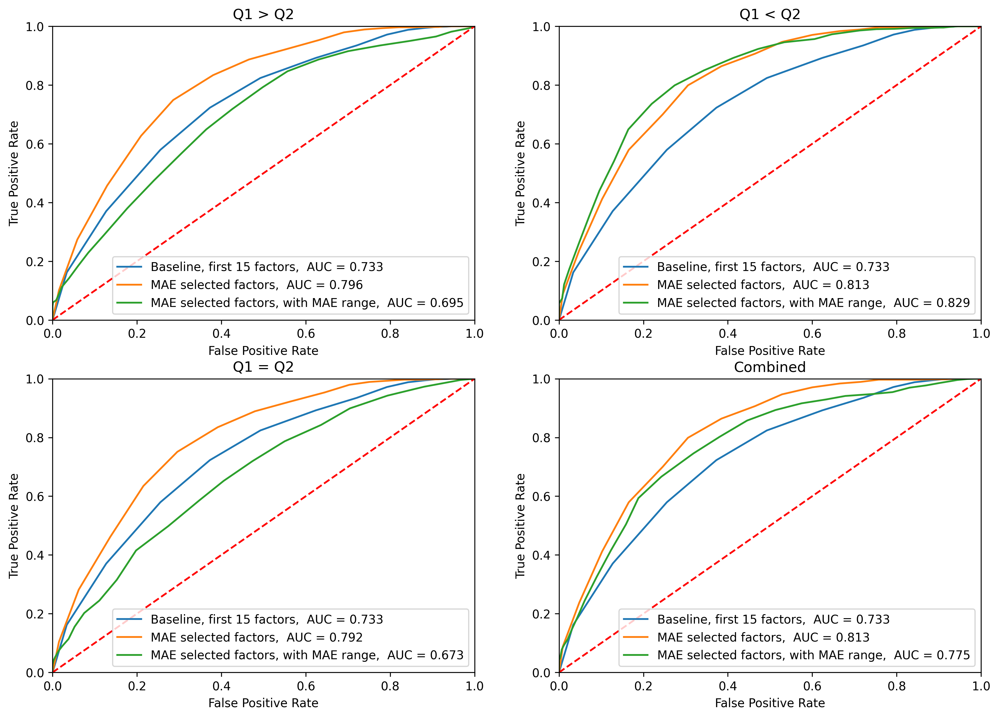

In [45]:
mae_range_qf_general = {}
for k, pos in pos_qf_general.items():
    mae_range_qf_general[k] = mae_qf_general[k][pos].round()

probs_mae_range_qf_general = {}
for k, mae_range in mae_range_qf_general.items():
    pos = pos_qf_general[k]
    uniform_confidence = np.ones(pos.shape) / pos.shape
    probs_mae_range_qf_general[k] = mae_range_classifier(casia_jpeg_results, casia_jpeg_results_fp, pos, uniform_confidence, mae_range)

nrow, ncol = 2, 2
plt.figure(figsize=(7*ncol,5*nrow))

for i, k in enumerate(probs_mae_range_qf_general.keys()):
    plt.subplot(nrow,ncol,i+1)
    plt.title(k)
    _plot_roc({
        "Baseline, first 15 factors, ": probs,
        "MAE selected factors, ": probs_qf_general[k],
#         "MAE selected pos, weighted confidence": probs_weighted_qf_general[k],
        "MAE selected factors, with MAE range, ": probs_mae_range_qf_general[k]
    }, labels)

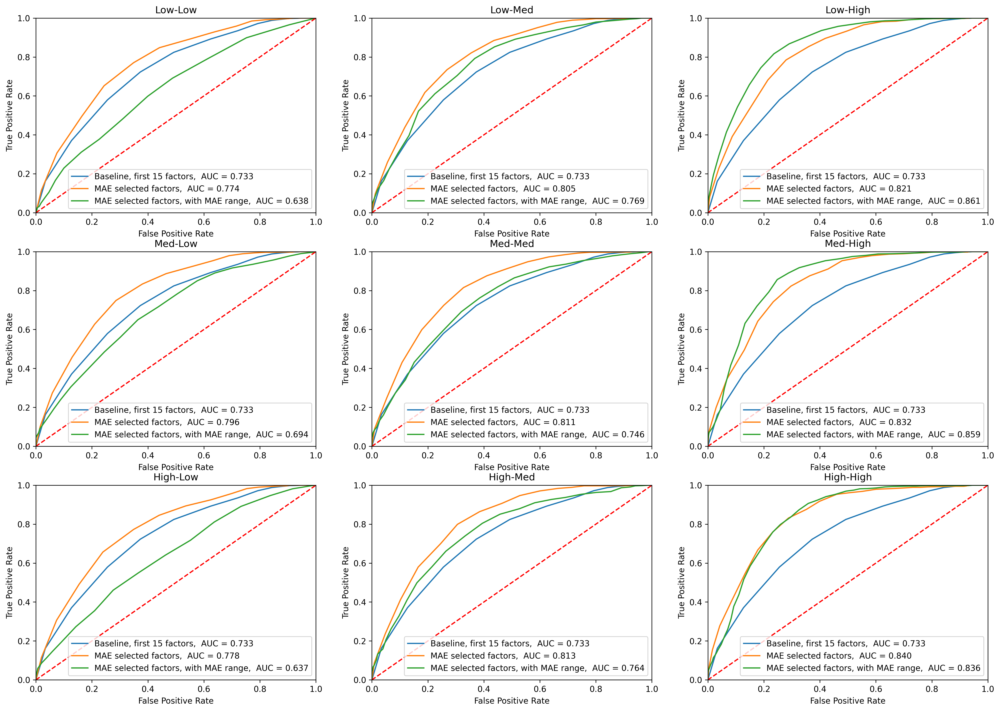

In [46]:
mae_range_qf_specific = {}
for k, pos in pos_qf_specific.items():
    mae_range_qf_specific[k] = mae_qf_specific[k][pos].round()
    
probs_mae_range_qf_specific = {}
for k, mae_range in mae_range_qf_specific.items():
    pos = pos_qf_specific[k]
    uniform_confidence = np.ones(pos.shape) / pos.shape
    probs_mae_range_qf_specific[k] = mae_range_classifier(casia_jpeg_results, casia_jpeg_results_fp, pos, uniform_confidence, mae_range)

nrow, ncol = 3, 3
plt.figure(figsize=(7*ncol,5*nrow))

for i, k in enumerate(probs_mae_range_qf_specific.keys()):
    plt.subplot(nrow,ncol,i+1)
    plt.title(k)
    _plot_roc({
        "Baseline, first 15 factors, ": probs,
        "MAE selected factors, ": probs_qf_specific[k],
#         "MAE selected pos, weighted confidence": probs_weighted_qf_specific[k],
        "MAE selected factors, with MAE range, ": probs_mae_range_qf_specific[k]
    }, labels)

Including the mae acceptable range boosts the performance only in the cases when QF2 is high (right column). This suggests that images in the CASIA dataset have a high second compression quality factor, in the range of 90-100.

In [48]:
with open('../experiments/res_random_qf_vary_block.pkl', 'rb') as handle:
    block_results = pickle.load(handle)

In [66]:
block_res_df = pd.DataFrame(block_results)
block_res_df.head()

,img,qf_1,qf_2,est_q_table,block_number
0,r146771d7t.jpg,60,55,"[[35.0, 13.0, 13.0, 4.0, 6.0, 1.0, 1.0, 1.0], ...",81.0
1,r1e3303ebt.jpg,90,50,"[[1.0, 3.0, 11.0, 5.0, 27.0, 38.0, 1.0, 1.0], ...",182.0
2,r1a2095b2t.jpg,50,60,"[[16.0, 13.0, 2.0, 11.0, 1.0, 1.0, 1.0, 1.0], ...",224.0
3,r15dfc1b8t.jpg,100,55,"[[1.0, 4.0, 12.0, 10.0, 1.0, 1.0, 1.0, 1.0], [...",64.0
4,r02897203t.jpg,50,100,"[[32.0, 11.0, 10.0, 16.0, 15.0, 20.0, 1.0, 16....",540.0


In [71]:
sorted_block_res_df = block_res_df.sort_values('block_number')
sorted_block_res_df.head()

,img,qf_1,qf_2,est_q_table,block_number
1436,r1ffa9ee3t.jpg,65,70,"[[1.0, 1.0, 16.0, 1.0, 1.0, 1.0, 3.0, 1.0], [1...",4.0
862,r00a940e1t.jpg,55,65,"[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1....",6.0
525,r0b7b1156t.jpg,75,85,"[[1.0, 14.0, 8.0, 1.0, 1.0, 6.0, 1.0, 1.0], [1...",6.0
374,r04cfa379t.jpg,80,55,"[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [1....",6.0
183,r0db31c3ft.jpg,65,60,"[[1.0, 1.0, 5.0, 1.0, 1.0, 1.0, 1.0, 1.0], [6....",8.0


In [76]:
block_qf1_greater_qf2 = sorted_block_res_df[sorted_block_res_df['qf_1'] > sorted_block_res_df['qf_2']]
block_qf1_lesser_qf2 = sorted_block_res_df[sorted_block_res_df['qf_1'] < sorted_block_res_df['qf_2']]
block_qf1_same_qf2 = sorted_block_res_df[sorted_block_res_df['qf_1'] == sorted_block_res_df['qf_2']]

block_qf_general_categories = {
    "Q1 > Q2": block_qf1_greater_qf2,
    "Q1 < Q2": block_qf1_lesser_qf2,
    "Q1 = Q2": block_qf1_same_qf2,
    "Combined": sorted_block_res_df
}

for k, v in block_qf_general_categories.items():
    print(f"{k}: {len(v)}")

Q1 > Q2: 905
Q1 < Q2: 916
Q1 = Q2: 178
Combined: 1999


Want to split each section into 20 bins

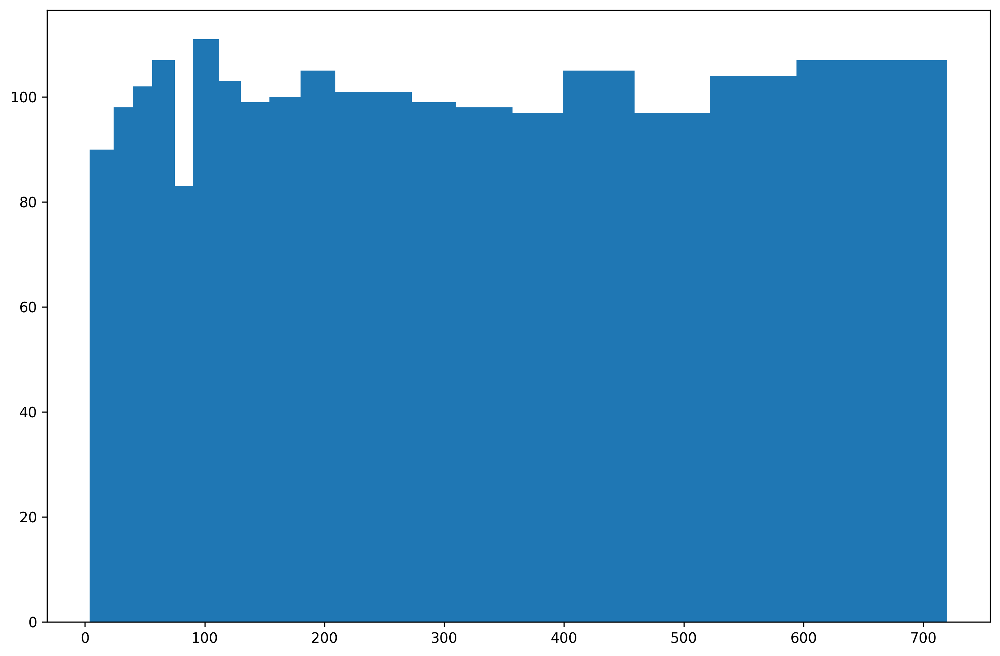

In [78]:
bn_mappings = list(zip(block_results['block_number'], block_results['est_q_table'], block_results['qf_1']))
sorted_bn_mappings = sorted(bn_mappings, key=lambda p: p[0])
bins = []
for i in range(0, 2000, 100):
    bins.append(int(sorted_bn_mappings[i][0]))
    
plt.hist(np.array(block_results['block_number']), bins=bins)
plt.show()

In [79]:
sorted_bn, sorted_q_tables, sorted_qf = zip(*sorted_bn_mappings)

bin_q_table_mappings = []
for i in range(len(bins)):
    bin_q_table_mappings.append(list(zip(sorted_q_tables[i*50:(i+1)*50], sorted_qf[i*50:(i+1)*50])))

In [104]:
curr_df = block_qf1_lesser_qf2

In [105]:
bn_threshold_acc = []

for i in range(20):
    interval = round(len(curr_df) / 20)
    df_interval = curr_df.iloc[i*interval:(i+1)*interval]
    diff = []
    for j, row in df_interval.iterrows():
        diff.append(row['est_q_table'] - scale_q_table(STANDARD_LUMI_QT, row['qf_1']))
    
    diff = np.array(diff)
    acc = np.count_nonzero(diff == 0, axis=0) / diff.shape[0] * 100
    acc_zigzag = acc[ZIGZAG_ROW_IDX, ZIGZAG_COL_IDX]
    bn_threshold_acc.append(acc_zigzag)

bn_threshold_acc = np.array(bn_threshold_acc)

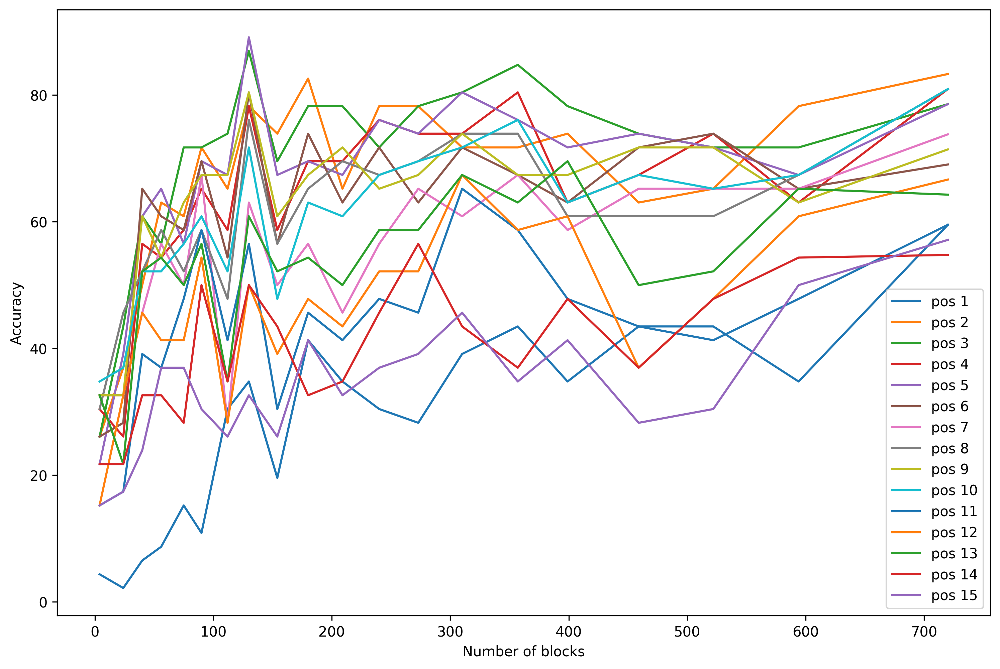

In [106]:
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams["figure.figsize"] = [12, 8]
for i in range(15):
    plt.plot(bins, bn_threshold_acc[:,i], label=f"Factor {i}")

# plt.plot(bins, bn_threshold_acc[:, 1:5].mean(axis=1), label="Overall")
plt.xlabel("Number of blocks")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [108]:
block_bn_threshold_acc = {}

for k, v in block_qf_general_categories.items():
    curr_df = v
    bn_threshold_acc = []

    for i in range(20):
        interval = round(len(curr_df) / 20)
        df_interval = curr_df.iloc[i*interval:(i+1)*interval]
        diff = []
        for j, row in df_interval.iterrows():
            diff.append(row['est_q_table'] - scale_q_table(STANDARD_LUMI_QT, row['qf_1']))

        diff = np.array(diff)
        acc = np.count_nonzero(diff == 0, axis=0) / diff.shape[0] * 100
        acc_zigzag = acc[ZIGZAG_ROW_IDX, ZIGZAG_COL_IDX]
        bn_threshold_acc.append(acc_zigzag)

    block_bn_threshold_acc[k] = np.array(bn_threshold_acc)

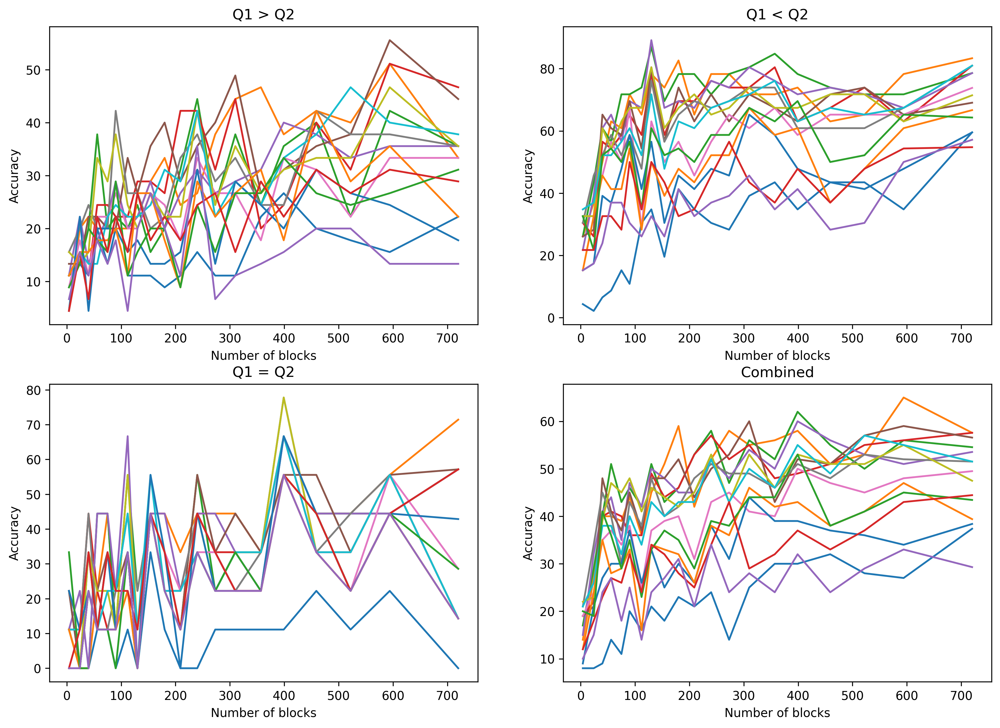

In [111]:
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams["figure.figsize"] = [12, 8]


def plot_bn_acc(bn_threshold_acc):
    for i in range(15):
        plt.plot(bins, bn_threshold_acc[:,i], label=f"Factor {i}")

    # plt.plot(bins, bn_threshold_acc[:, 1:5].mean(axis=1), label="Overall")
    plt.xlabel("Number of blocks")
    plt.ylabel("Accuracy")
#     plt.legend()
#     plt.show()

nrow, ncol = 2, 2
plt.figure(figsize=(7*ncol,5*nrow))

for i, (k, v) in enumerate(block_bn_threshold_acc.items()):
    plt.subplot(nrow,ncol,i+1)
    plt.title(k)
    plot_bn_acc(block_bn_threshold_acc[k])

In [80]:
bn_threshold_acc = []
for i, qt_qf_list in enumerate(bin_q_table_mappings):
    diff = []
    for qt, qf in qt_qf_list:
        diff.append(qt - scale_q_table(STANDARD_LUMI_QT, qf))
    diff = np.array(diff)
    acc = np.count_nonzero(diff == 0, axis=0) / diff.shape[0] * 100
    acc_zigzag = acc[ZIGZAG_ROW_IDX, ZIGZAG_COL_IDX]
    bn_threshold_acc.append(acc_zigzag)

bn_threshold_acc = np.array(bn_threshold_acc)

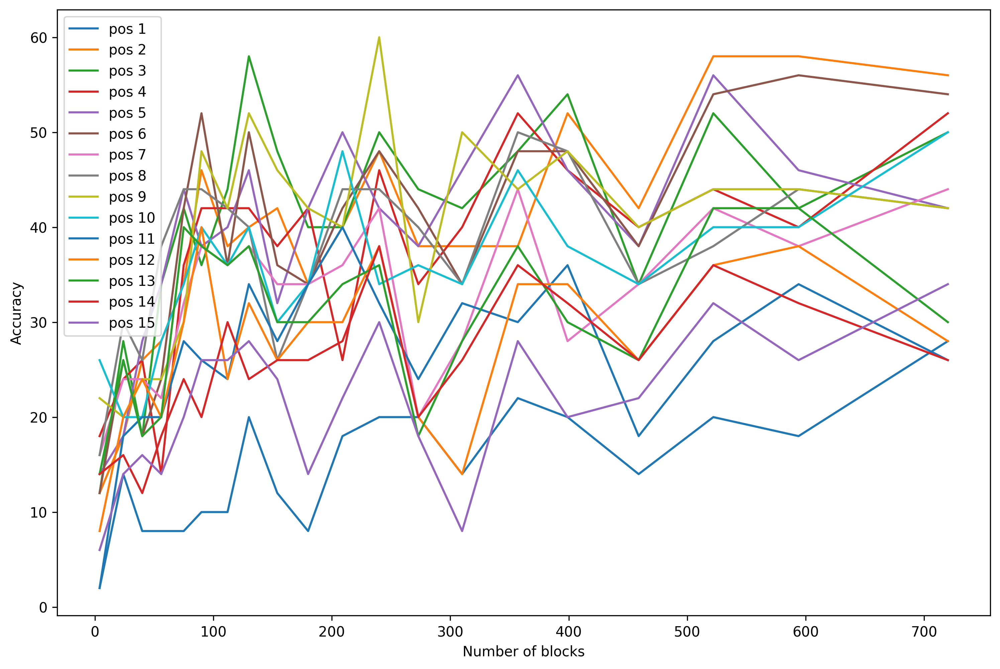

In [90]:
matplotlib.rcParams['figure.dpi'] = 300
matplotlib.rcParams["figure.figsize"] = [12, 8]
for i in range(15):
    plt.plot(bins, bn_threshold_acc[:,i], label=f"pos {i+1}")

# plt.plot(bins, bn_threshold_acc[:, 1:5].mean(axis=1), label="Overall")
plt.xlabel("Number of blocks")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

## Why low-> high performs well, looking at DCT coefficients

In [113]:
def compute_dct_coefficient_histogram(im_path, bin_range=50):
    im = jpeglib.read_dct(im_path)
    q_table = im.qt[0]  # read the luminance quantization table
    dct_coef = im.Y.reshape(-1, 8, 8).transpose(0, 2, 1) * q_table[None,:]    
    k_factor_list = dct_coef.reshape(-1, 64).transpose()
    
    histograms = []
    bins = []
    for k in k_factor_list:
        # bin_range+2 since right most is excluded, ref: https://stackoverflow.com/questions/9141732/how-does-numpy-histogram-work
        h, b = np.histogram(k, bins=np.arange(-bin_range,bin_range+2))
        histograms.append(h)
        bins.append(b)

    return np.array(histograms), np.array(bins)

In [167]:
matplotlib.rcParams['figure.dpi'] = 500
matplotlib.rcParams["figure.figsize"] = [6.4, 4.8]

In [173]:
im_path = "../raise_1k/r146771d7t.TIF"
im = Image.open(im_path)

q_table_1 = scale_q_table(STANDARD_LUMI_QT, 60)
q_table_2 = scale_q_table(STANDARD_LUMI_QT, 95)

buf1 = jpeg_compress_to_buffer(im, q_table_1.reshape(-1))
with open("singly_compressed.jpg", "wb") as f:
    f.write(buf1.getbuffer())

im_com = Image.open(buf1)

buf2 = jpeg_compress_to_buffer(im_com, q_table_2.reshape(-1))
with open("doubly_compressed.jpg", "wb") as f:
    f.write(buf2.getbuffer())

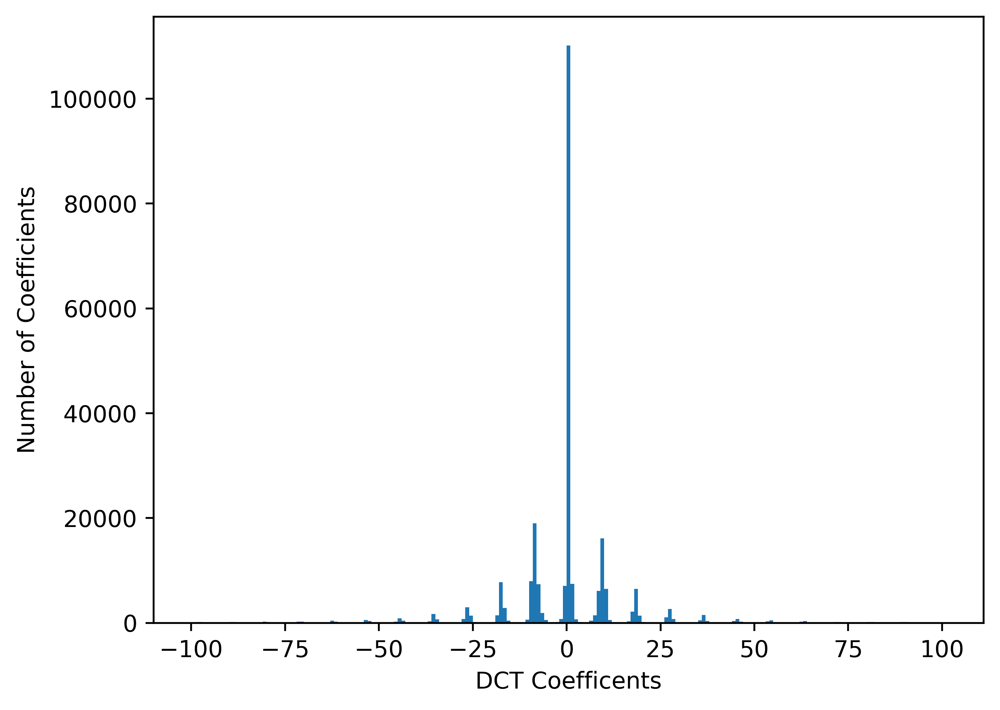

In [175]:
histograms, bins = compute_dct_coefficient_histogram("doubly_compressed.jpg", bin_range=100)

h = histograms[1]
b = bins[1]
center = (b[:-1] + b[1:]) / 2
plt.bar(center, h, align='center', width=1)
plt.xlabel("DCT Coefficents")
plt.ylabel("Number of Coefficients")
plt.show()